In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

from sklearn.datasets import make_blobs, make_circles
from sklearn.datasets import load_boston, load_iris, load_diabetes, load_digits, load_linnerud, load_wine, load_breast_cancer

# from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
# from sklearn.linear_model import SGDClassifier, SGDRegressor
# from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
# from sklearn.ensemble import GradientBoostingClassifier, GradientBoostingRegressor
# from sklearn.svm import SVC, SVR
# from sklearn.neural_network import MLPClassifier, MLPRegressor

In [2]:
boston = load_boston()
print('Boston:\t\t', boston.keys())
iris = load_iris()
print('Iris:\t\t', iris.keys())
diabetes = load_diabetes()
print('Diabetes:\t', diabetes.keys())
digits = load_digits()
print('Digits:\t\t', digits.keys())
linnerud = load_linnerud()
print('Linnerud:\t', linnerud.keys())
wine = load_wine()
print('Wine:\t\t', wine.keys())
cancer = load_breast_cancer()
print('Breast cancer:\t', cancer.keys())

Boston:		 dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])
Iris:		 dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])
Diabetes:	 dict_keys(['data', 'target', 'frame', 'DESCR', 'feature_names', 'data_filename', 'target_filename'])
Digits:		 dict_keys(['data', 'target', 'frame', 'feature_names', 'target_names', 'images', 'DESCR'])
Linnerud:	 dict_keys(['data', 'feature_names', 'target', 'target_names', 'frame', 'DESCR', 'data_filename', 'target_filename'])
Wine:		 dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names'])
Breast cancer:	 dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])


/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  """


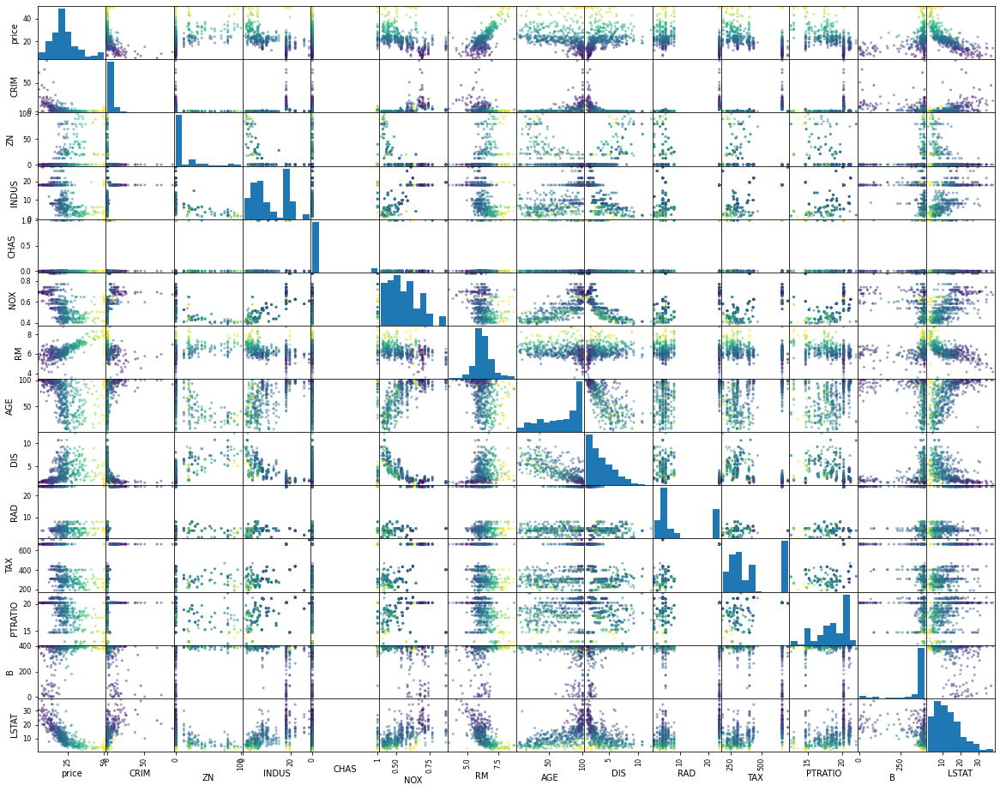

,price,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,24.0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,21.6,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,34.7,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,33.4,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,36.2,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,22.4,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,20.6,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,23.9,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,22.0,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [3]:
# print(boston.data[:5,:], boston.target[:5])
# print(boston.feature_names)
boston_table = pd.DataFrame(data = np.hstack((np.transpose([boston.target]), boston.data)), columns = ['price'] + list(boston.feature_names))
fig, ax = plt.subplots(1,1,figsize=(20,16))
pd.plotting.scatter_matrix(boston_table, ax = ax, c = boston.target)
plt.show()
display(boston_table)
print(boston.DESCR)

,setosa or versicolor or virginica,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
0,0.0,5.1,3.5,1.4,0.2
1,0.0,4.9,3.0,1.4,0.2
2,0.0,4.7,3.2,1.3,0.2
3,0.0,4.6,3.1,1.5,0.2
4,0.0,5.0,3.6,1.4,0.2
...,...,...,...,...,...
145,2.0,6.7,3.0,5.2,2.3
146,2.0,6.3,2.5,5.0,1.9
147,2.0,6.5,3.0,5.2,2.0
148,2.0,6.2,3.4,5.4,2.3


/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


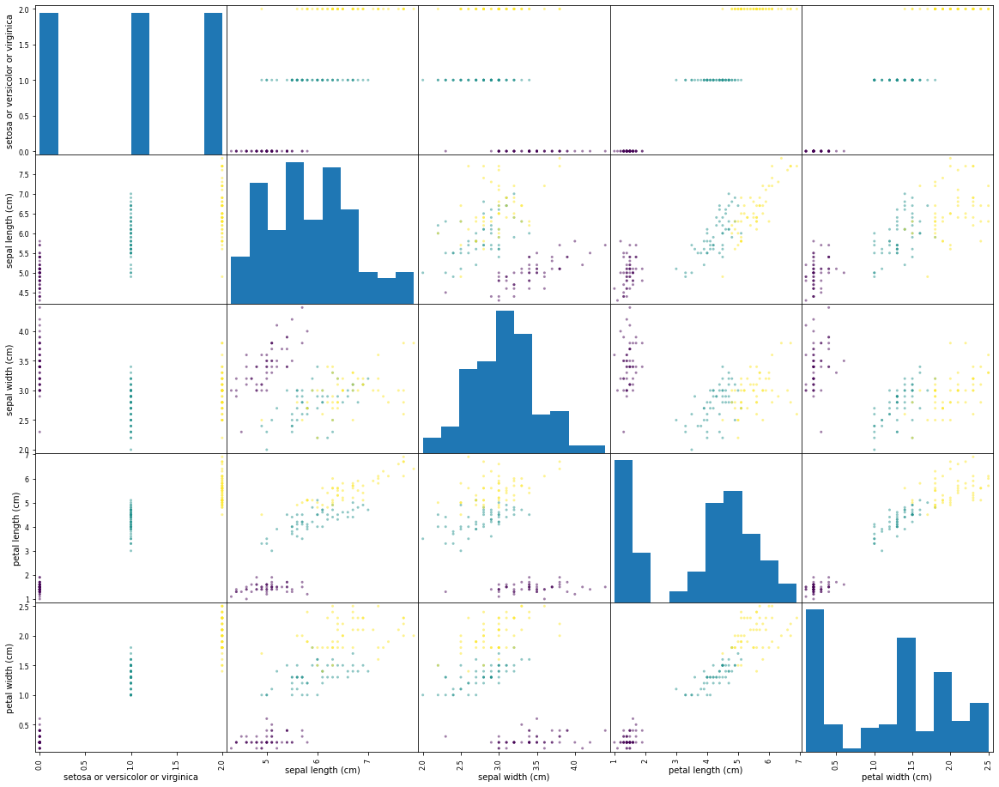

.. _iris_dataset:

Iris plants dataset
--------------------

**Data Set Characteristics:**

    :Number of Instances: 150 (50 in each of three classes)
    :Number of Attributes: 4 numeric, predictive attributes and the class
    :Attribute Information:
        - sepal length in cm
        - sepal width in cm
        - petal length in cm
        - petal width in cm
        - class:
                - Iris-Setosa
                - Iris-Versicolour
                - Iris-Virginica
                
    :Summary Statistics:

    ============== ==== ==== ======= ===== ====================
                    Min  Max   Mean    SD   Class Correlation
    ============== ==== ==== ======= ===== ====================
    sepal length:   4.3  7.9   5.84   0.83    0.7826
    sepal width:    2.0  4.4   3.05   0.43   -0.4194
    petal length:   1.0  6.9   3.76   1.76    0.9490  (high!)
    petal width:    0.1  2.5   1.20   0.76    0.9565  (high!)
    ============== ==== ==== ======= ===== ===========

In [4]:
iris_table = pd.DataFrame(data = np.hstack((np.transpose([iris.target]), iris.data)), columns = [' or '.join(iris.target_names)] + list(iris.feature_names))
display(iris_table)
fig, ax = plt.subplots(1,1,figsize=(20,16))
pd.plotting.scatter_matrix(iris_table, ax = ax, c = iris.target)
plt.show()
print(iris.DESCR)

,target,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6
0,151.0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019908,-0.017646
1,75.0,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068330,-0.092204
2,141.0,0.085299,0.050680,0.044451,-0.005671,-0.045599,-0.034194,-0.032356,-0.002592,0.002864,-0.025930
3,206.0,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022692,-0.009362
4,135.0,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031991,-0.046641
...,...,...,...,...,...,...,...,...,...,...,...
437,178.0,0.041708,0.050680,0.019662,0.059744,-0.005697,-0.002566,-0.028674,-0.002592,0.031193,0.007207
438,104.0,-0.005515,0.050680,-0.015906,-0.067642,0.049341,0.079165,-0.028674,0.034309,-0.018118,0.044485
439,132.0,0.041708,0.050680,-0.015906,0.017282,-0.037344,-0.013840,-0.024993,-0.011080,-0.046879,0.015491
440,220.0,-0.045472,-0.044642,0.039062,0.001215,0.016318,0.015283,-0.028674,0.026560,0.044528,-0.025930


/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  after removing the cwd from sys.path.


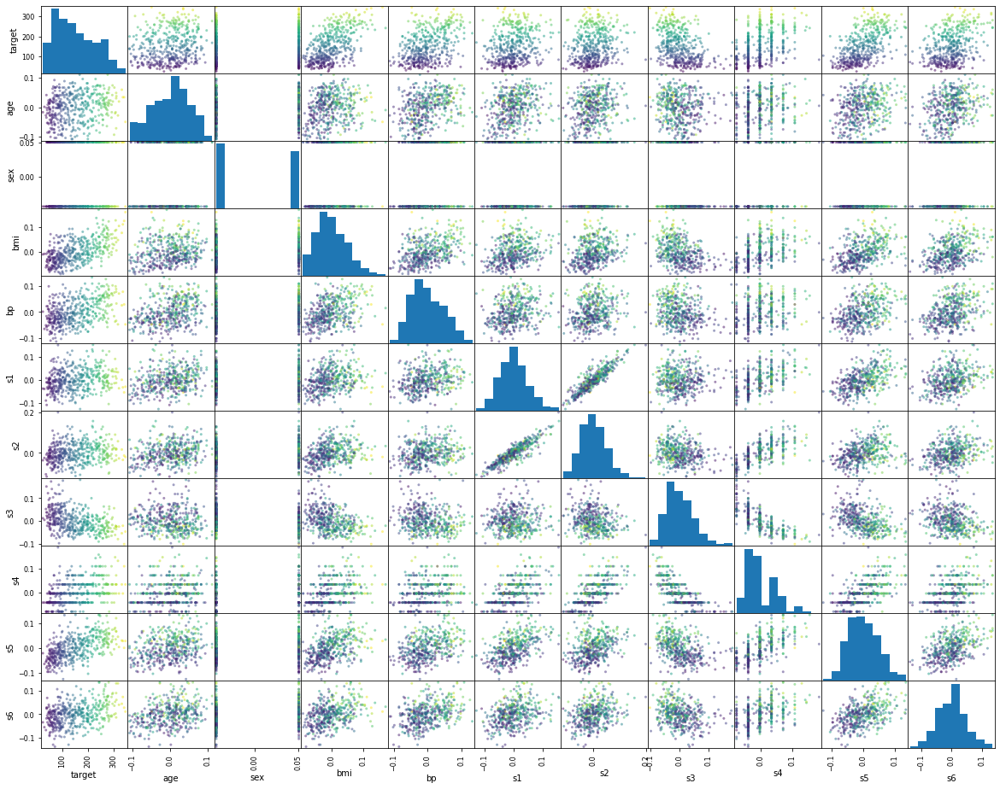

.. _diabetes_dataset:

Diabetes dataset
----------------

Ten baseline variables, age, sex, body mass index, average blood
pressure, and six blood serum measurements were obtained for each of n =
442 diabetes patients, as well as the response of interest, a
quantitative measure of disease progression one year after baseline.

**Data Set Characteristics:**

  :Number of Instances: 442

  :Number of Attributes: First 10 columns are numeric predictive values

  :Target: Column 11 is a quantitative measure of disease progression one year after baseline

  :Attribute Information:
      - age     age in years
      - sex
      - bmi     body mass index
      - bp      average blood pressure
      - s1      tc, T-Cells (a type of white blood cells)
      - s2      ldl, low-density lipoproteins
      - s3      hdl, high-density lipoproteins
      - s4      tch, thyroid stimulating hormone
      - s5      ltg, lamotrigine
      - s6      glu, blood sugar level

Note: Each of these 10 feature va

In [5]:
diabetes_table = pd.DataFrame(data = np.hstack((np.transpose([diabetes.target]), diabetes.data)), columns = ['target'] + list(diabetes.feature_names))
display(diabetes_table)
fig, ax = plt.subplots(1,1,figsize=(20,16))
pd.plotting.scatter_matrix(diabetes_table, ax = ax, c = diabetes.target)
plt.show()
print(diabetes.DESCR)


In [333]:
# diabetes_table = pd.DataFrame(data = np.hstack((np.transpose([diabetes.target]), diabetes.data)), columns = ['target'] + list(diabetes.feature_names))
# display(diabetes_table)
# fig, ax = plt.subplots(1,1,figsize=(20,16))
# pd.plotting.scatter_matrix(diabetes_table, ax = ax, c = diabetes.target)
# plt.show()
print(digits.target)
print(digits.images)
print(digits.DESCR)

[0 1 2 ... 8 9 8]
[[[ 0.  0.  5. ...  1.  0.  0.]
  [ 0.  0. 13. ... 15.  5.  0.]
  [ 0.  3. 15. ... 11.  8.  0.]
  ...
  [ 0.  4. 11. ... 12.  7.  0.]
  [ 0.  2. 14. ... 12.  0.  0.]
  [ 0.  0.  6. ...  0.  0.  0.]]

 [[ 0.  0.  0. ...  5.  0.  0.]
  [ 0.  0.  0. ...  9.  0.  0.]
  [ 0.  0.  3. ...  6.  0.  0.]
  ...
  [ 0.  0.  1. ...  6.  0.  0.]
  [ 0.  0.  1. ...  6.  0.  0.]
  [ 0.  0.  0. ... 10.  0.  0.]]

 [[ 0.  0.  0. ... 12.  0.  0.]
  [ 0.  0.  3. ... 14.  0.  0.]
  [ 0.  0.  8. ... 16.  0.  0.]
  ...
  [ 0.  9. 16. ...  0.  0.  0.]
  [ 0.  3. 13. ... 11.  5.  0.]
  [ 0.  0.  0. ... 16.  9.  0.]]

 ...

 [[ 0.  0.  1. ...  1.  0.  0.]
  [ 0.  0. 13. ...  2.  1.  0.]
  [ 0.  0. 16. ... 16.  5.  0.]
  ...
  [ 0.  0. 16. ... 15.  0.  0.]
  [ 0.  0. 15. ... 16.  0.  0.]
  [ 0.  0.  2. ...  6.  0.  0.]]

 [[ 0.  0.  2. ...  0.  0.  0.]
  [ 0.  0. 14. ... 15.  1.  0.]
  [ 0.  4. 16. ... 16.  7.  0.]
  ...
  [ 0.  0.  0. ... 16.  2.  0.]
  [ 0.  0.  4. ... 16.  2.  0.]
  [ 0.  0.

/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  


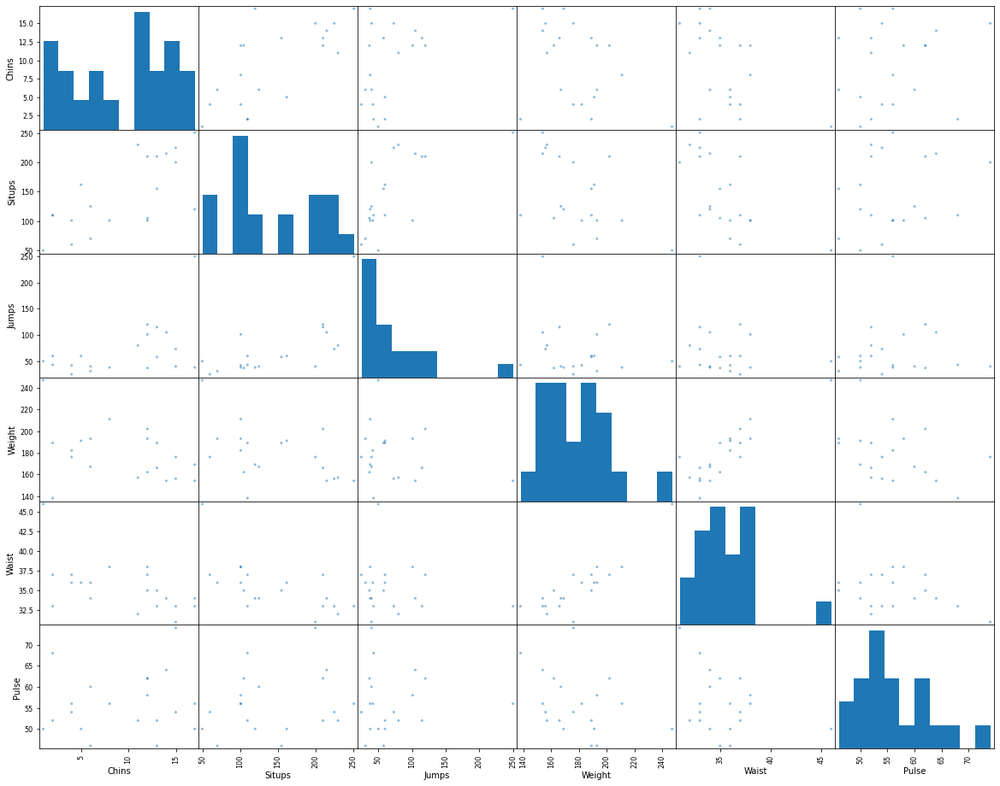

,Chins,Situps,Jumps,Weight,Waist,Pulse
0,5.0,162.0,60.0,191.0,36.0,50.0
1,2.0,110.0,60.0,189.0,37.0,52.0
2,12.0,101.0,101.0,193.0,38.0,58.0
3,12.0,105.0,37.0,162.0,35.0,62.0
4,13.0,155.0,58.0,189.0,35.0,46.0
5,4.0,101.0,42.0,182.0,36.0,56.0
6,8.0,101.0,38.0,211.0,38.0,56.0
7,6.0,125.0,40.0,167.0,34.0,60.0
8,15.0,200.0,40.0,176.0,31.0,74.0
9,17.0,251.0,250.0,154.0,33.0,56.0


.. _linnerrud_dataset:

Linnerrud dataset
-----------------

**Data Set Characteristics:**

    :Number of Instances: 20
    :Number of Attributes: 3
    :Missing Attribute Values: None

The Linnerud dataset is a multi-output regression dataset. It consists of three
excercise (data) and three physiological (target) variables collected from
twenty middle-aged men in a fitness club:

- *physiological* - CSV containing 20 observations on 3 physiological variables:
   Weight, Waist and Pulse.
- *exercise* - CSV containing 20 observations on 3 exercise variables:
   Chins, Situps and Jumps.

.. topic:: References

  * Tenenhaus, M. (1998). La regression PLS: theorie et pratique. Paris:
    Editions Technic.



In [7]:
# print(linnerud.data)
# print(linnerud.target)
# print(linnerud.data.shape)
# print(linnerud.target.shape)

linnerud_table = pd.DataFrame(data = np.hstack((linnerud.data, linnerud.target)), columns = list(linnerud.feature_names) + list(linnerud.target_names))
fig, ax = plt.subplots(1,1,figsize=(20,16))
pd.plotting.scatter_matrix(linnerud_table, ax = ax)
plt.show()
display(linnerud_table)
print(linnerud.DESCR)


/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  


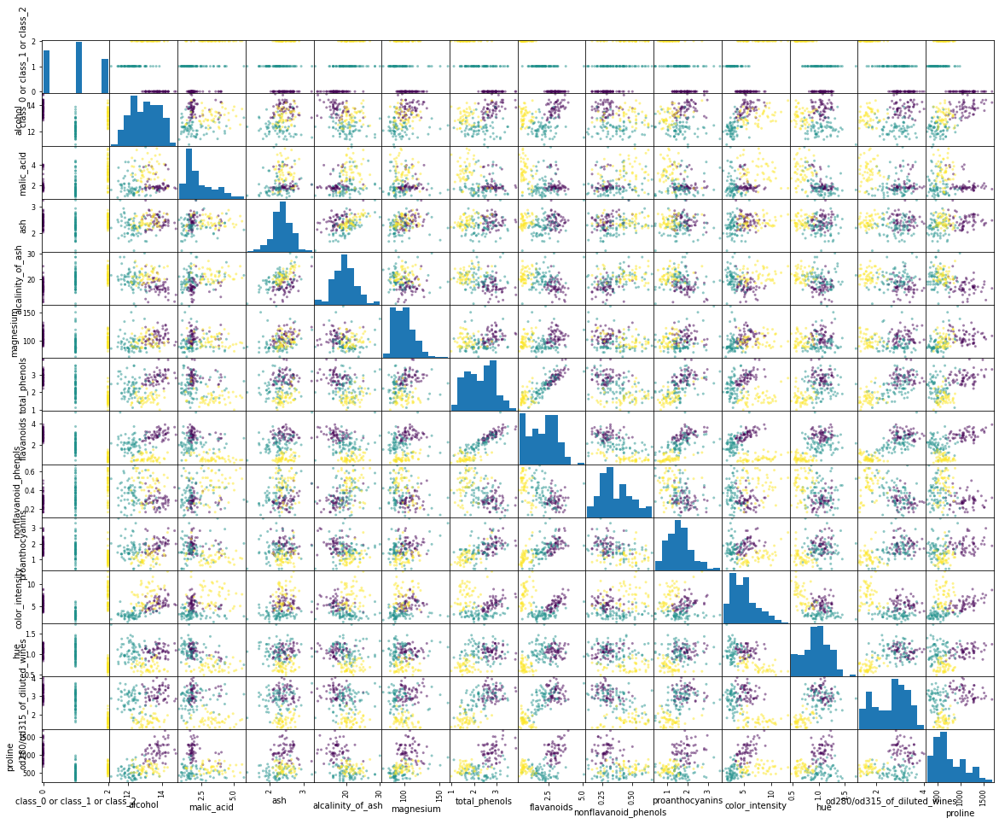

,class_0 or class_1 or class_2,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,0.0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,0.0,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,0.0,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,0.0,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,0.0,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,2.0,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,2.0,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,2.0,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,2.0,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


.. _wine_dataset:

Wine recognition dataset
------------------------

**Data Set Characteristics:**

    :Number of Instances: 178 (50 in each of three classes)
    :Number of Attributes: 13 numeric, predictive attributes and the class
    :Attribute Information:
 		- Alcohol
 		- Malic acid
 		- Ash
		- Alcalinity of ash  
 		- Magnesium
		- Total phenols
 		- Flavanoids
 		- Nonflavanoid phenols
 		- Proanthocyanins
		- Color intensity
 		- Hue
 		- OD280/OD315 of diluted wines
 		- Proline

    - class:
            - class_0
            - class_1
            - class_2
		
    :Summary Statistics:
    
    ============================= ==== ===== ======= =====
                                   Min   Max   Mean     SD
    ============================= ==== ===== ======= =====
    Alcohol:                      11.0  14.8    13.0   0.8
    Malic Acid:                   0.74  5.80    2.34  1.12
    Ash:                          1.36  3.23    2.36  0.27
    Alcalinity of Ash:            1

In [8]:
# print(wine.data)
# print(wine.target)
# print(wine.data.shape)
# print(wine.target.shape)

wine_table = pd.DataFrame(data = np.hstack((np.transpose([wine.target]), wine.data)), columns = [' or '.join(wine.target_names)] + list(wine.feature_names))
fig, ax = plt.subplots(1,1,figsize=(20,16))
pd.plotting.scatter_matrix(wine_table, ax = ax, c = wine.target)
plt.show()
display(wine_table)
print(wine.DESCR)



/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: UserWarning: To output multiple subplots, the figure containing the passed axes is being cleared
  


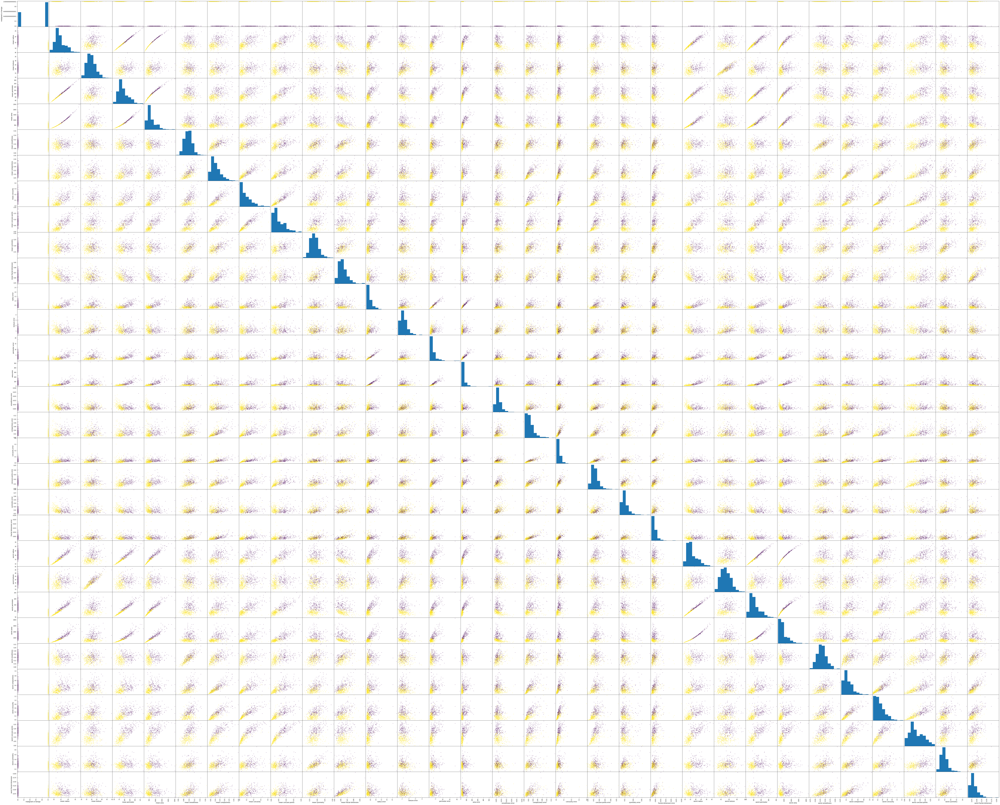

,malignant or benign,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,0.0,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,0.0,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,0.0,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,0.0,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,0.0,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,0.0,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,0.0,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,0.0,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

    :Number of Instances: 569

    :Number of Attributes: 30 numeric, predictive attributes and the class

    :Attribute Information:
        - radius (mean of distances from center to points on the perimeter)
        - texture (standard deviation of gray-scale values)
        - perimeter
        - area
        - smoothness (local variation in radius lengths)
        - compactness (perimeter^2 / area - 1.0)
        - concavity (severity of concave portions of the contour)
        - concave points (number of concave portions of the contour)
        - symmetry
        - fractal dimension ("coastline approximation" - 1)

        The mean, standard error, and "worst" or largest (mean of the three
        worst/largest values) of these features were computed for each image,
        resulting in 30 features.  For instance, field 0 is Mean Radi

In [9]:
# print(cancer.data)
# print(cancer.target)
# print(cancer.data.shape)
# print(cancer.target.shape)

cancer_table = pd.DataFrame(data = np.hstack((np.transpose([cancer.target]), cancer.data)), columns = [' or '.join(cancer.target_names)] + list(cancer.feature_names))
fig, ax = plt.subplots(1,1,figsize=(120,100))
pd.plotting.scatter_matrix(cancer_table, ax = ax, c = cancer.target)
# plt.savefig('cancer_scatter_matrix', dpi = 300)
plt.show()
display(cancer_table)
print(cancer.DESCR)


In [102]:
def score(alg, name, X_train, X_test, y_train, y_test):
    print(name, 'Train:\t', alg.score(X_train, y_train))
    print(name, 'Test:\t', alg.score(X_test, y_test))

In [215]:
X, y = (iris.data, iris.target)
# X = StandardScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.linear_model import SGDClassifier

sgd = SGDClassifier().fit(X_train, y_train)
print('SGD Train:\t', sgd.score(X_train, y_train))
print('SGD Test:\t', sgd.score(X_test, y_test))

from sklearn.linear_model import Ridge

ridge = Ridge(alpha = 1).fit(X_train, y_train)
print('Ridge Train:\t', ridge.score(X_train, y_train))
print('Ridge Test:\t', ridge.score(X_test, y_test))

SGD Train:	 0.9111111111111111
SGD Test:	 0.8857142857142857
Ridge Train:	 0.9432787596032453
Ridge Test:	 0.9135429966452424


Tree Train:	 0.9777777777777777
Tree Test:	 0.9523809523809523
Forest Train:	 1.0
Forest Test:	 0.9523809523809523
GBC Train:	 1.0
GBC Test:	 0.9523809523809523


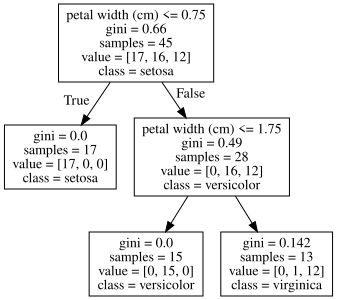

In [176]:
X, y = (iris.data, iris.target)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_leaf_nodes = 3).fit(X_train, y_train)
print('Tree Train:\t', tree.score(X_train, y_train))
print('Tree Test:\t', tree.score(X_test, y_test))

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators = 100, max_leaf_nodes = 5, max_depth = 4).fit(X_train, y_train)
print('Forest Train:\t', rf.score(X_train, y_train))
print('Forest Test:\t', rf.score(X_test, y_test))

from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier(n_estimators = 80, max_leaf_nodes = 5, learning_rate = 0.1).fit(X_train, y_train)
print('GBC Train:\t', gbc.score(X_train, y_train))
print('GBC Test:\t', gbc.score(X_test, y_test))

from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(tree, feature_names = iris.feature_names, class_names = iris.target_names)
graph = graphviz.Source(dot_data)
display(graph)

In [233]:
X, y = (iris.data, iris.target)
X = StandardScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.svm import SVC

svc = SVC(kernel = 'rbf', C = 10, max_iter = 1000).fit(X_train, y_train)
print('SVC RBF Train:\t', svc.score(X_train, y_train))
print('SVC RBF Test:\t', svc.score(X_test, y_test))

from sklearn.svm import LinearSVC

linsvc = LinearSVC(max_iter = 10000, C = 300, penalty = 'l2').fit(X_train, y_train)
print('SVC Lin Train:\t', linsvc.score(X_train, y_train))
print('SVC LIn Test:\t', linsvc.score(X_test, y_test))

SVC RBF Train:	 1.0
SVC RBF Test:	 0.9523809523809523
SVC Lin Train:	 1.0
SVC LIn Test:	 0.9619047619047619


/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/sklearn/svm/_base.py:977: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [232]:
X, y = (iris.data, iris.target)
X = StandardScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(max_iter = 1000, alpha = 10, hidden_layer_sizes = (1,), solver = 'lbfgs').fit(X_train, y_train)
print('MLP Train:\t', linsvc.score(X_train, y_train))
print('MLP Test:\t', linsvc.score(X_test, y_test))

MLP Train:	 1.0
MLP Test:	 0.9619047619047619


In [242]:
X, y = (load_digits().data, load_digits().target)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.linear_model import SGDClassifier

sgd = SGDClassifier().fit(X_train, y_train)
print('SGD Train:\t', sgd.score(X_train, y_train))
print('SGD Test:\t', sgd.score(X_test, y_test))

from sklearn.linear_model import Ridge

ridge = Ridge(alpha = 0.0001).fit(X_train, y_train)
print('Ridge Train:\t', ridge.score(X_train, y_train))
print('Ridge Test:\t', ridge.score(X_test, y_test))

SGD Train:	 0.9795918367346939
SGD Test:	 0.9395866454689984
Ridge Train:	 0.6570235020799767
Ridge Test:	 0.49800518660471094


Tree Train:	 0.9628942486085343
Tree Test:	 0.7774244833068362
Forest Train:	 0.8404452690166976
Forest Test:	 0.7869634340222575
GBC Train:	 1.0
GBC Test:	 0.9300476947535771


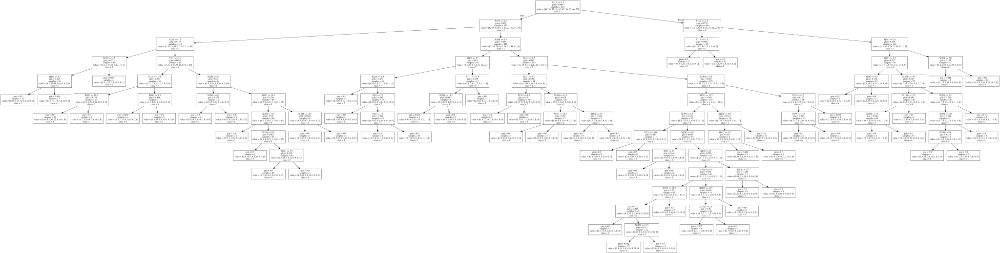

In [256]:
X, y = (load_digits().data, load_digits().target)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(max_leaf_nodes = 60).fit(X_train, y_train)
print('Tree Train:\t', tree.score(X_train, y_train))
print('Tree Test:\t', tree.score(X_test, y_test))

from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators = 100, max_leaf_nodes = 5, max_depth = 4).fit(X_train, y_train)
print('Forest Train:\t', rf.score(X_train, y_train))
print('Forest Test:\t', rf.score(X_test, y_test))

from sklearn.ensemble import GradientBoostingClassifier

gbc = GradientBoostingClassifier(n_estimators = 80, max_leaf_nodes = 5, learning_rate = 0.1).fit(X_train, y_train)
print('GBC Train:\t', gbc.score(X_train, y_train))
print('GBC Test:\t', gbc.score(X_test, y_test))

from sklearn.tree import export_graphviz
import graphviz

dot_data = export_graphviz(tree, class_names = [str(i) for i in digits.target_names])
graph = graphviz.Source(dot_data)
display(graph)

In [308]:
X, y = (digits.data, digits.target)
# X = StandardScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.svm import SVC

svc_rbf = SVC(kernel = 'rbf', C = 2, max_iter = 1000).fit(X_train, y_train)
print('SVC RBF Train:\t', svc_rbf.score(X_train, y_train))
print('SVC RBF Test:\t', svc_rbf.score(X_test, y_test))

from sklearn.svm import SVC

svc_poly = SVC(kernel = 'poly', C = 0.5, max_iter = 1000).fit(X_train, y_train)
print('SVC Poly Train:\t', svc_poly.score(X_train, y_train))
print('SVC Poly Test:\t', svc_poly.score(X_test, y_test))

from sklearn.svm import LinearSVC

linsvc = LinearSVC(max_iter = 10000, C = 0.001, penalty = 'l2').fit(X_train, y_train)
print('SVC Lin Train:\t', linsvc.score(X_train, y_train))
print('SVC LIn Test:\t', linsvc.score(X_test, y_test))

SVC RBF Train:	 0.9981447124304267
SVC RBF Test:	 0.9848966613672496
SVC Poly Train:	 0.9944341372912802
SVC Poly Test:	 0.9785373608903021
SVC Lin Train:	 0.9907235621521335
SVC LIn Test:	 0.9531001589825119


In [329]:
X, y = (digits.data, digits.target)
# X = StandardScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier(max_iter = 1000, alpha = 10, hidden_layer_sizes = (10,10), solver = 'adam', learning_rate = 'adaptive').fit(X_train, y_train)
print('MLP Train:\t', linsvc.score(X_train, y_train))
print('MLP Test:\t', linsvc.score(X_test, y_test))

MLP Train:	 0.9907235621521335
MLP Test:	 0.9531001589825119


/Users/hadierturk/opt/anaconda3/lib/python3.7/site-packages/sklearn/neural_network/_multilayer_perceptron.py:585: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1000) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


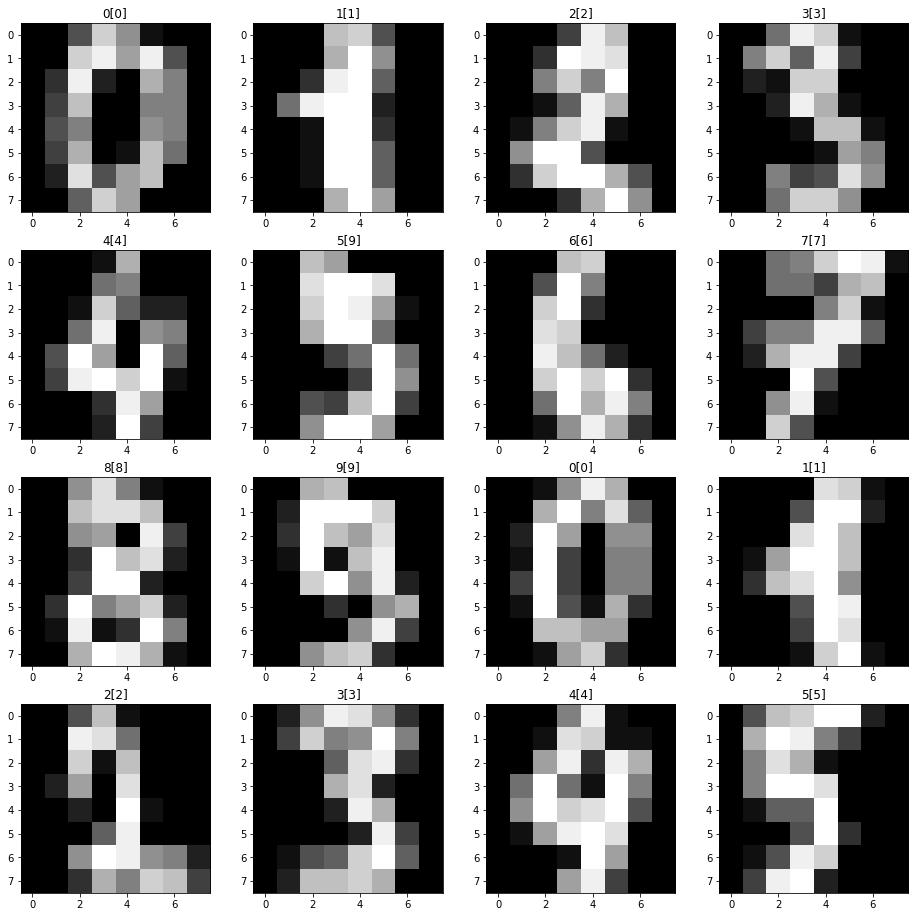

In [366]:
from PIL import Image

fig, ax = plt.subplots(4,4,figsize=(16,16))

X, y = (digits.data, digits.target)
# X = StandardScaler().fit(X).transform(X)
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.3, random_state = 0)

svc_rbf = SVC(kernel = 'rbf', C = 2, max_iter = 1000).fit(X_train, y_train)
# print('SVC RBF Train:\t', svc_rbf.score(X_train, y_train))
# print('SVC RBF Test:\t', svc_rbf.score(X_test, y_test))

for i in range(4):
    for j in range(4):
        ind = 4*i + j
        ax[i,j].imshow(Image.fromarray(16 * digits.images[ind]))
        ax[i,j].set_title(str(digits.target[ind]) + str(svc_rbf.predict(digits.data[ind].reshape(1,-1))))